🐙

Tacotron: Towards End-to-End Speech Synthesis: https://arxiv.org/abs/1703.10135

code: https://github.com/r9y9/tacotron_pytorch

In [1]:
# Choose your favorite model
checkpoint_path = "../checkpoints/checkpoint_step720000.pth"

In [2]:
%pylab inline
rcParams["figure.figsize"] = (16,5)

# Use text & audio modules from existing Tacotron implementation.
import sys
sys.path.insert(0, "../lib/tacotron")
from text import text_to_sequence, symbols
from util import audio

Populating the interactive namespace from numpy and matplotlib


In [20]:
import torch
import numpy as np

from tacotron_pytorch import Tacotron
from synthesis import tts as _tts
from hparams import hparams

import os
import librosa
import librosa.display
import IPython
from IPython.display import Audio

In [4]:
fs = hparams.sample_rate
hop_length = 250

In [5]:
def visualize(alignment, spectrogram):
    label_fontsize = 16
    figure(figsize=(16,16))
    
    subplot(2,1,1)
    imshow(alignment.T, aspect="auto", origin="lower", interpolation=None)
    xlabel("Decoder timestamp", fontsize=label_fontsize)
    ylabel("Encoder timestamp", fontsize=label_fontsize)
    colorbar()

    subplot(2,1,2)
    librosa.display.specshow(spectrogram.T, sr=fs, 
                             hop_length=hop_length, x_axis="time", y_axis="linear")
    xlabel("Time", fontsize=label_fontsize)
    ylabel("Hz", fontsize=label_fontsize)
    tight_layout()
    colorbar()

In [6]:
def tts(model, text, figures=True):
    waveform, alignment, spectrogram = _tts(model, text)
    if figures:
        visualize(alignment, spectrogram)
    IPython.display.display(Audio(waveform, rate=fs))

## Model

In [7]:
model = Tacotron(n_vocab=len(symbols),
                 embedding_dim=256,
                 mel_dim=hparams.num_mels,
                 linear_dim=hparams.num_freq,
                 r=hparams.outputs_per_step,
                 padding_idx=hparams.padding_idx,
                 use_memory_mask=hparams.use_memory_mask,
                 )
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint["state_dict"])

# Set large max_decoder steps to handle long sentence outputs
model.decoder.max_decoder_steps = 500

## TTS samples

### Generatd audio and alignment

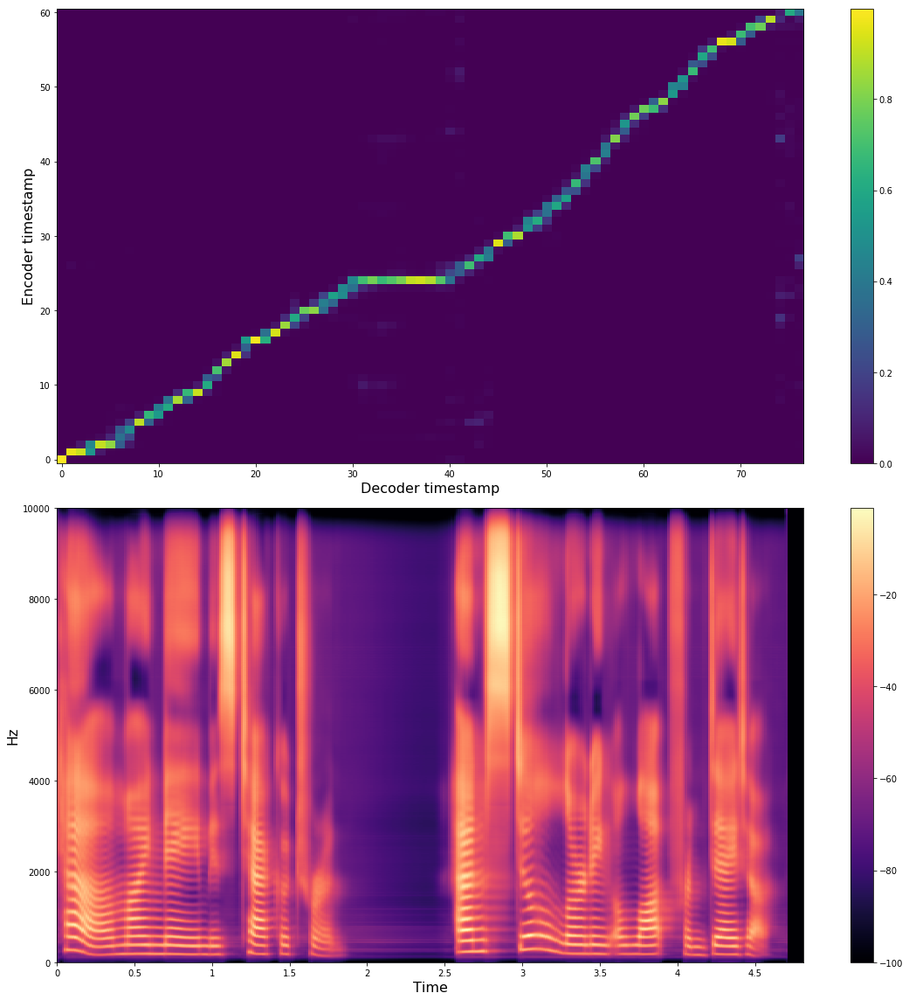

In [8]:
tts(model, "Hi, my name is Tacotron. I'm still learning a lot from data.")

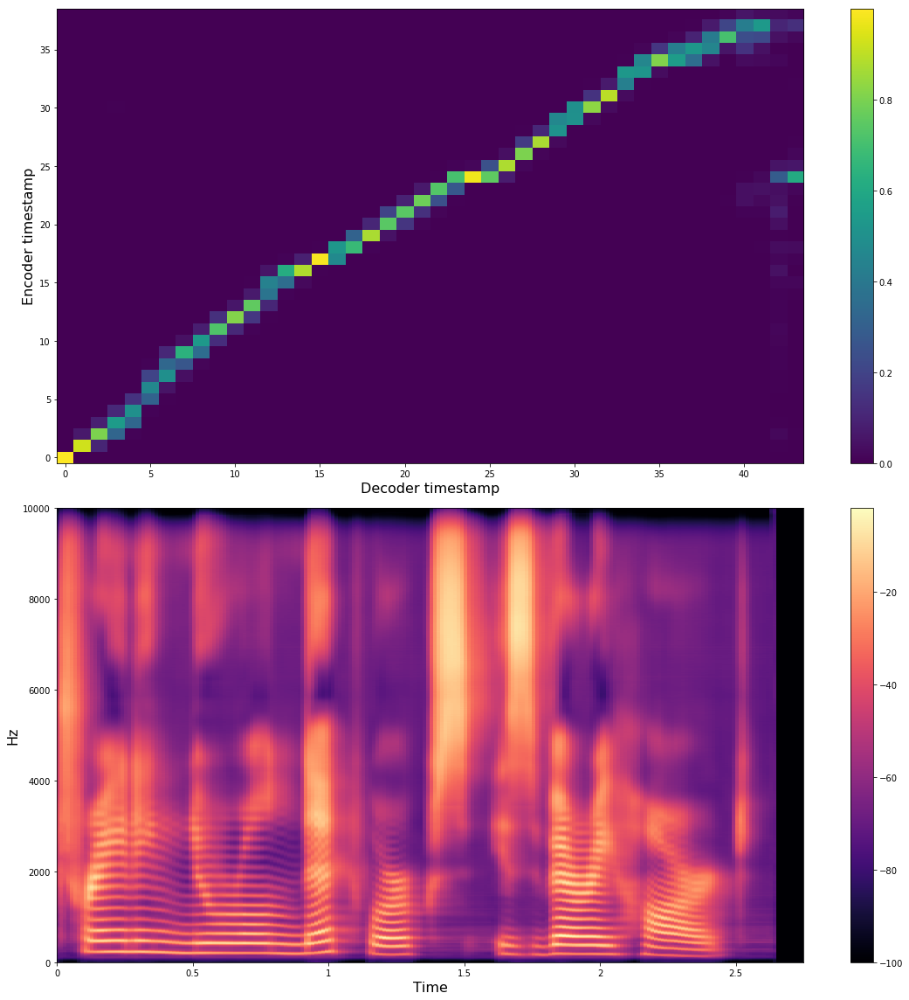

In [9]:
tts(model, "Training neural networks is very hard!")

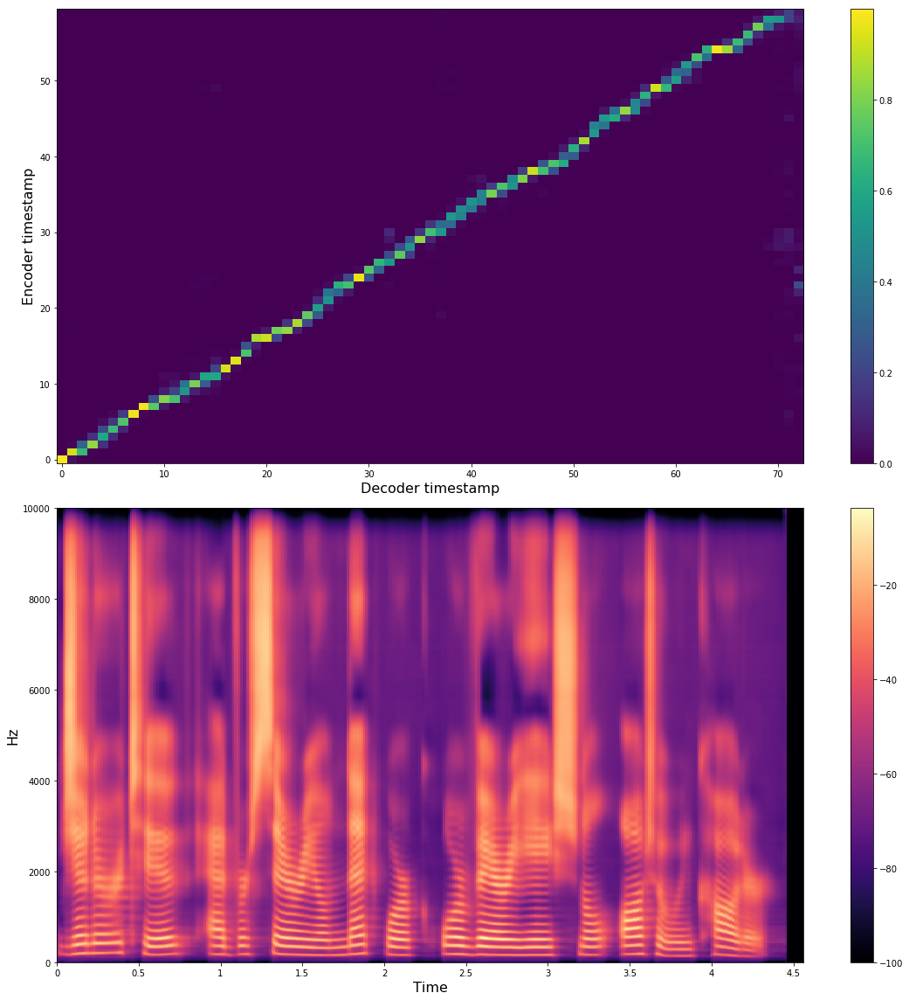

In [10]:
tts(model, "Generative adversarial network or variational auto-encoder.")

### Compare with keithito/tacotron

Same sentences used in https://keithito.github.io/audio-samples/

In [11]:
texts = [
    "Scientists at the CERN laboratory say they have discovered a new particle.",
    "There's a way to measure the acute emotional intelligence that has never gone out of style.",
    "President Trump met with other leaders at the Group of 20 conference.",
    "The Senate's bill to repeal and replace the Affordable Care Act is now imperiled.",
    "Generative adversarial network or variational auto-encoder.",
    "The buses aren't the problem, they actually provide a solution.",
]

for idx, text in enumerate(texts):
    print(idx, text)
    tts(model, text, figures=False)

0 Scientists at the CERN laboratory say they have discovered a new particle.


1 There's a way to measure the acute emotional intelligence that has never gone out of style.


2 President Trump met with other leaders at the Group of 20 conference.


3 The Senate's bill to repeal and replace the Affordable Care Act is now imperiled.


4 Generative adversarial network or variational auto-encoder.


5 The buses aren't the problem, they actually provide a solution.


### Try long inputs

Interestingly, tacotron can generate fairly long speech samples even if it's trained from dataset consists of short clips.

194


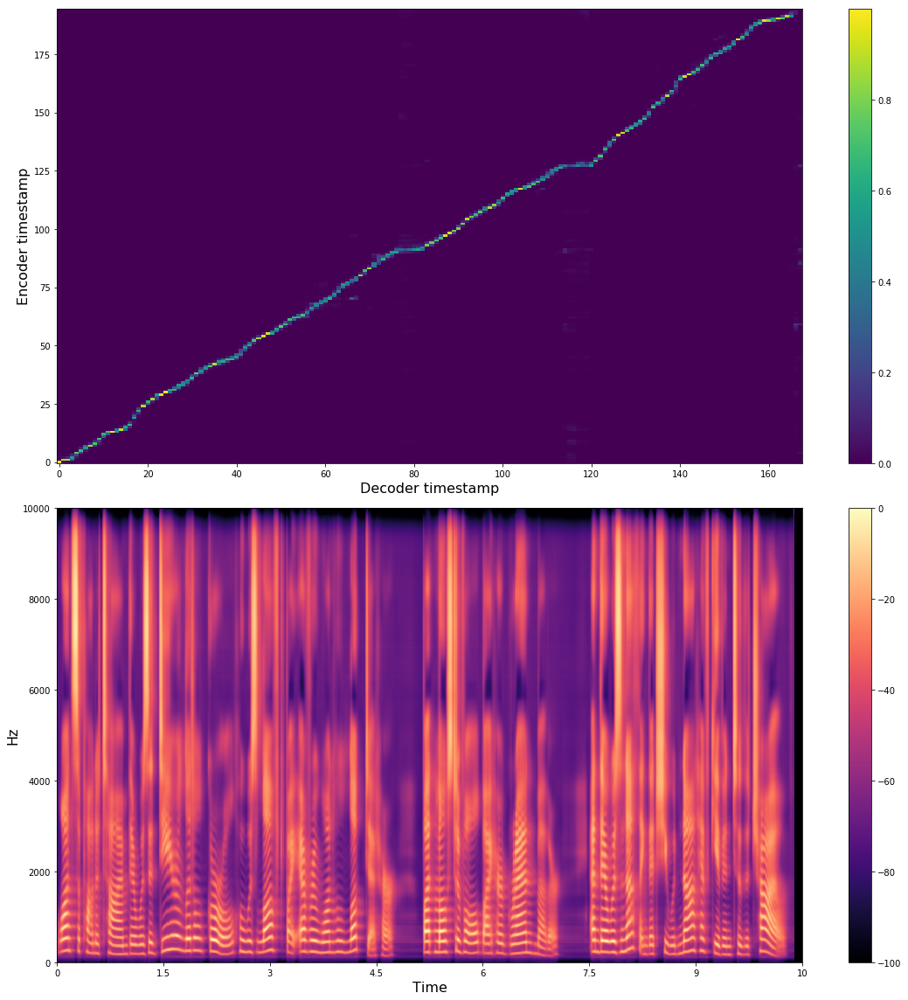

In [12]:
# ref: https://americanliterature.com/childrens-stories/little-red-riding-hood
text = """Once upon a time there was a dear little girl who was loved by every one who looked at her,
but most of all by her grandmother, and there was nothing that she would not have given to the child.
""".replace('\n', ' ')
print(len(text))
tts(model, text)

158


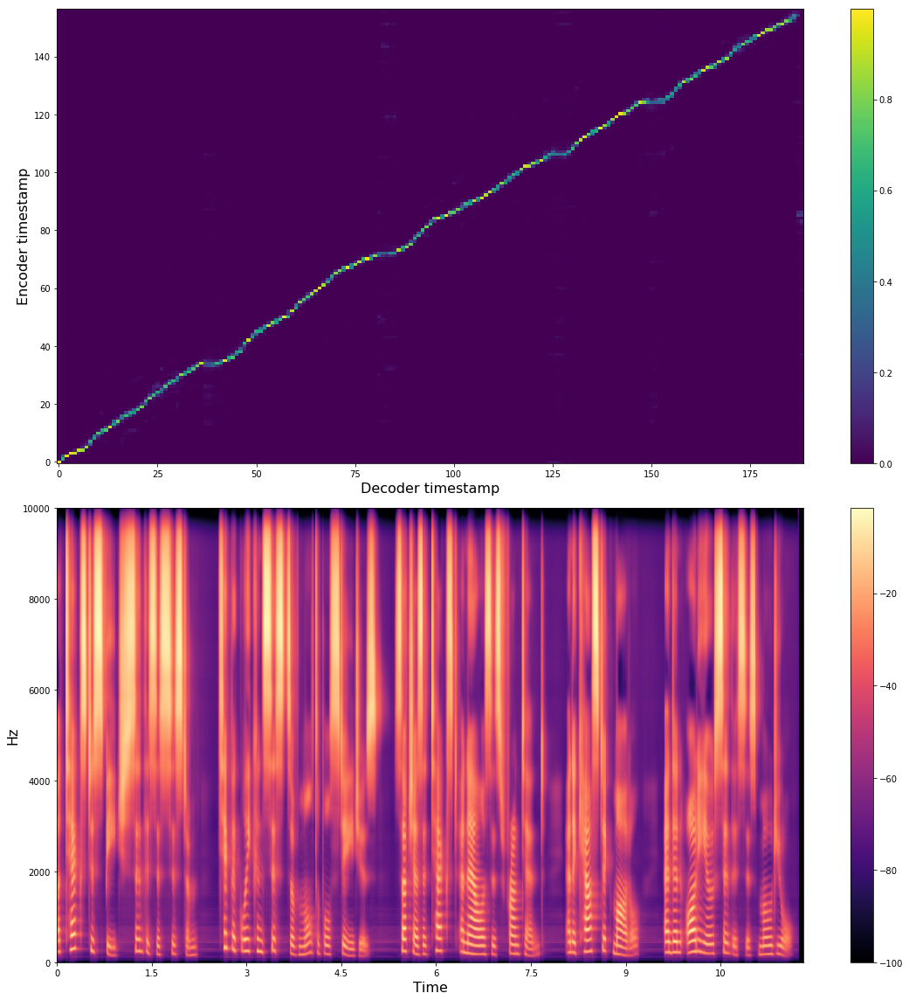

In [13]:
# Ref: https://arxiv.org/abs/1703.10135
text = """A text-to-speech synthesis system typically consists of multiple stages, 
such as a text analysis frontend, an acoustic model and an audio synthesis module. 
""".replace('\n', ' ')
print(len(text))
tts(model, text)

### Failure cases: too long inputs

263


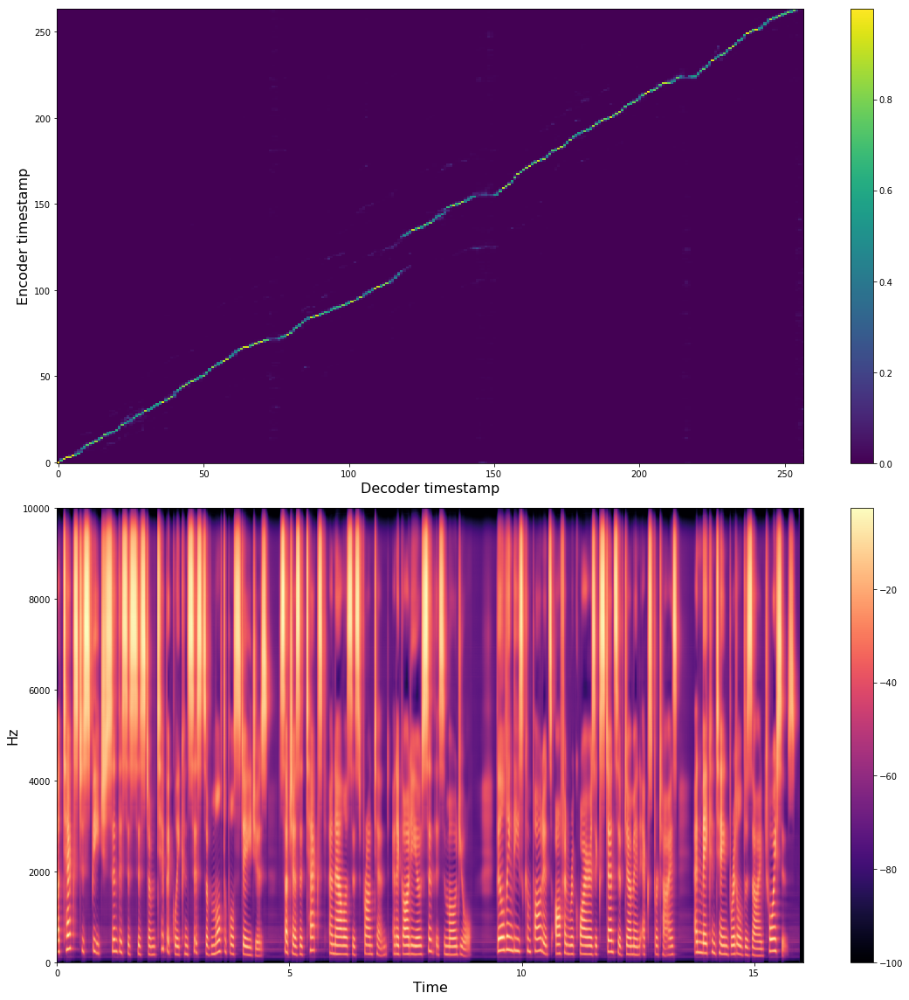

In [14]:
# Ref: https://arxiv.org/abs/1703.10135
text = """A text-to-speech synthesis system typically consists of multiple stages,
such as a text analysis frontend, an acoustic model and an audio synthesis module.
Building these components often requires extensive domain expertise and may
contain brittle design choices.""".replace('\n', ' ')
print(len(text))
tts(model, text)

356


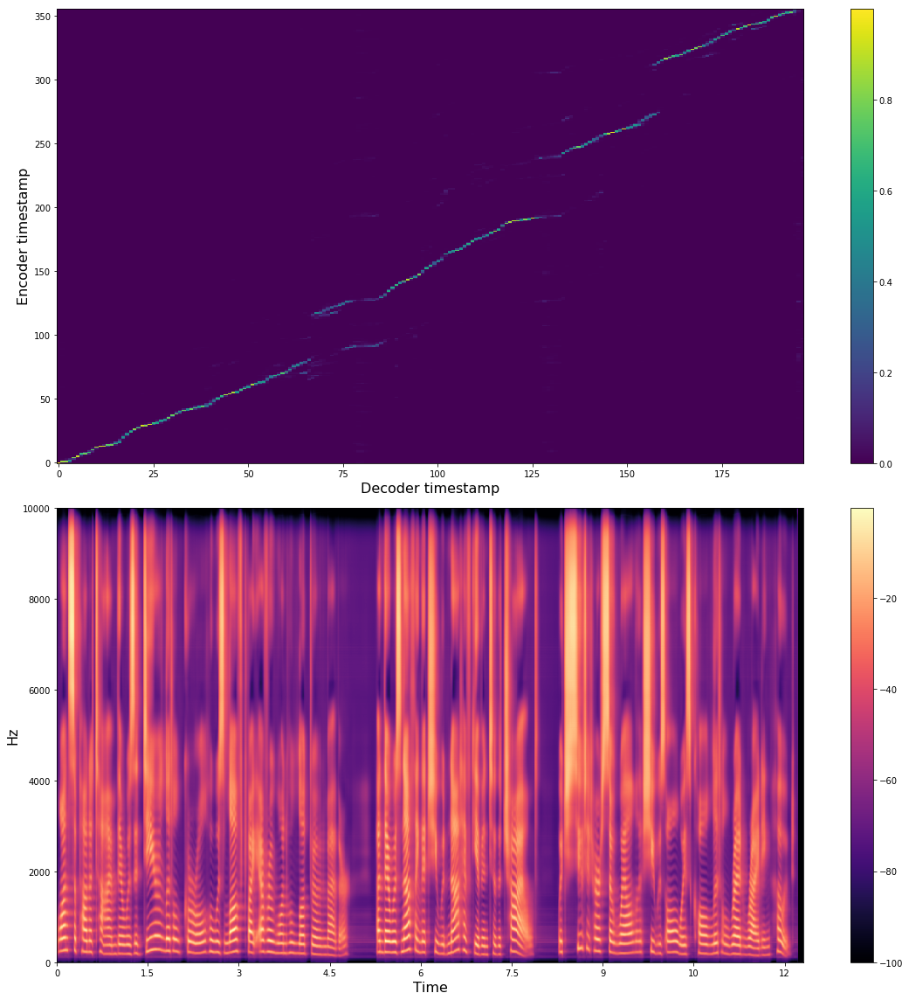

In [15]:
# ref: https://americanliterature.com/childrens-stories/little-red-riding-hood
text = """Once upon a time there was a dear little girl who was loved by every one who looked at her,
but most of all by her grandmother, and there was nothing that she would not have given to the child.
Once she gave her a little cap of red velvet,
which suited her so well that she would never wear anything else. 
So she was always called Little Red Riding Hood.
"""
print(len(text))
tts(model, text)

### Compare with google's demo

Same sentences used in https://google.github.io/tacotron/

In [16]:
texts = [
    "Generative adversarial network or variational auto-encoder.",
    "Basilar membrane and otolaryngology are not auto-correlations.",
    "He has read the whole thing.",
    "He reads books.",
    "Thisss isrealy awhsome.",
    "This is your personal assistant, Google Home.",
    "This is your personal assistant Google Home.",
    # Below two sentences are same in our experimental settings
    # "The buses aren't the problem, they actually provide a solution.",
    # "The buses aren't the PROBLEM, they actually provide a SOLUTION.",
    "The quick brown fox jumps over the lazy dog.",
    "Does the quick brown fox jump over the lazy dog?",   
]
    
for idx, text in enumerate(texts):
    print(idx, text)
    tts(model, text, figures=False)

0 Generative adversarial network or variational auto-encoder.


1 Basilar membrane and otolaryngology are not auto-correlations.


2 He has read the whole thing.


3 He reads books.


4 Thisss isrealy awhsome.


5 This is your personal assistant, Google Home.


6 This is your personal assistant Google Home.


7 The quick brown fox jumps over the lazy dog.


8 Does the quick brown fox jump over the lazy dog?


## Compare to ground truth

In [17]:
from os.path import join
from scipy.io import wavfile

In [18]:
data_root = "/home/ryuichi/data/LJSpeech-1.0/"

In [19]:
with open(join(data_root, "metadata.csv")) as f:
    lines = f.readlines()[:10]
    for line in lines:
        line = line.strip().split("|")
        name, text = line[0], line[1]
        if text[-1] not in '!,.:;?':
            text = text + '.' # without this decoder is confused when to output EOS
        print(text)
        
        # Target wav
        wav_path = join(data_root, "wavs", name + ".wav")
        _fs, target_waveform = wavfile.read(wav_path)
        IPython.display.display(Audio(target_waveform, rate=_fs))
        
        # Generated wav
        waveform, _, _ = _tts(model, text)
        IPython.display.display(Audio(waveform, rate=fs))

Printing, in the only sense with which we are at present concerned, differs from most if not from all the arts and crafts represented in the Exhibition.


in being comparatively modern.


For although the Chinese took impressions from wood blocks engraved in relief for centuries before the woodcutters of the Netherlands, by a similar process.


produced the block books, which were the immediate predecessors of the true printed book,


the invention of movable metal letters in the middle of the fifteenth century may justly be considered as the invention of the art of printing.


And it is worth mention in passing that, as an example of fine typography,


the earliest book printed with movable types, the Gutenberg, or "forty-two line Bible" of about 1455,


has never been surpassed.


Printing, then, for our purpose, may be considered as the art of making books by means of movable types.


Now, as all books not primarily intended as picture-books consist principally of types composed to form letterpress,


Well, far from ground truth:(